**1: Import Libraries**

In [20]:
# Core Libraries
import numpy as np
import pandas as pd
import os
import random

# Visualization Libraries
import matplotlib.pyplot as plt
import seaborn as sns

# TensorFlow & Keras
import tensorflow as tf
from tensorflow.keras import layers, models
from tensorflow.keras.applications import ResNet50, MobileNetV2, EfficientNetB0
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint

# Metrics & Evaluation
from sklearn.metrics import classification_report, confusion_matrix

# Ignore warnings
import warnings
warnings.filterwarnings('ignore')

**2: Data Loading**

**a. Define Dataset Path**

In [21]:
# Dataset path (since you're in the same directory)
DATASET_DIR = "RealWaste"

# Verify dataset exists
print("Dataset exists:", os.path.exists(DATASET_DIR))

Dataset exists: True


**b. Explore Directory Structure**

In [22]:
# Get class names (subfolders)
classes = sorted(os.listdir(DATASET_DIR))

print("Classes found:", classes)
print("Number of classes:", len(classes))

Classes found: ['Cardboard', 'Food Organics', 'Glass', 'Metal', 'Miscellaneous Trash', 'Paper', 'Plastic', 'Textile Trash', 'Vegetation']
Number of classes: 9


**c. Count Images per Class**

In [23]:
# Count images in each class
class_counts = {}

for cls in classes:
    class_path = os.path.join(DATASET_DIR, cls)
    class_counts[cls] = len(os.listdir(class_path))

# Convert to DataFrame for better visualization
df_counts = pd.DataFrame(list(class_counts.items()), columns=["Class", "Count"])

print(df_counts)

                 Class  Count
0            Cardboard    461
1        Food Organics    411
2                Glass    420
3                Metal    790
4  Miscellaneous Trash    495
5                Paper    500
6              Plastic    921
7        Textile Trash    318
8           Vegetation    436


**d. Total Images**

In [24]:
total_images = sum(class_counts.values())

print("Total images in dataset:", total_images)

Total images in dataset: 4752


**3: Exploratory Data Analysis**

**a. Class Distribution Plot**

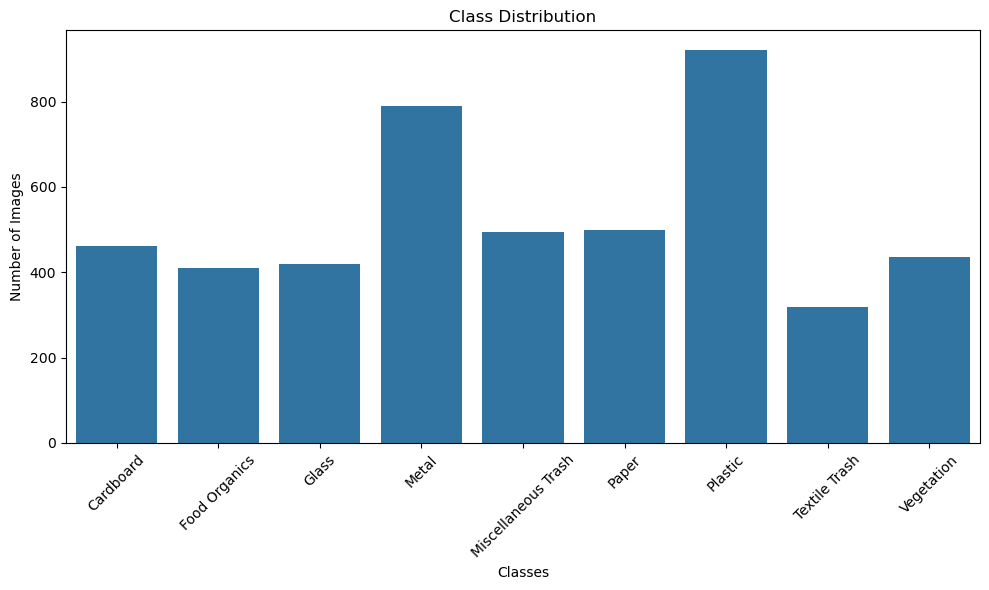

In [25]:
plt.figure(figsize=(10, 6))
sns.barplot(x="Class", y="Count", data=df_counts)

plt.xticks(rotation=45)
plt.title("Class Distribution")
plt.xlabel("Classes")
plt.ylabel("Number of Images")

plt.tight_layout()
plt.show()

The dataset exhibits moderate class imbalance, with Plastic and Metal classes dominating the distribution, while Textile Trash and Food Organics are underrepresented. This imbalance may lead to biased learning and requires mitigation through augmentation and regularization strategies.

**b. Display Sample Images per Class**

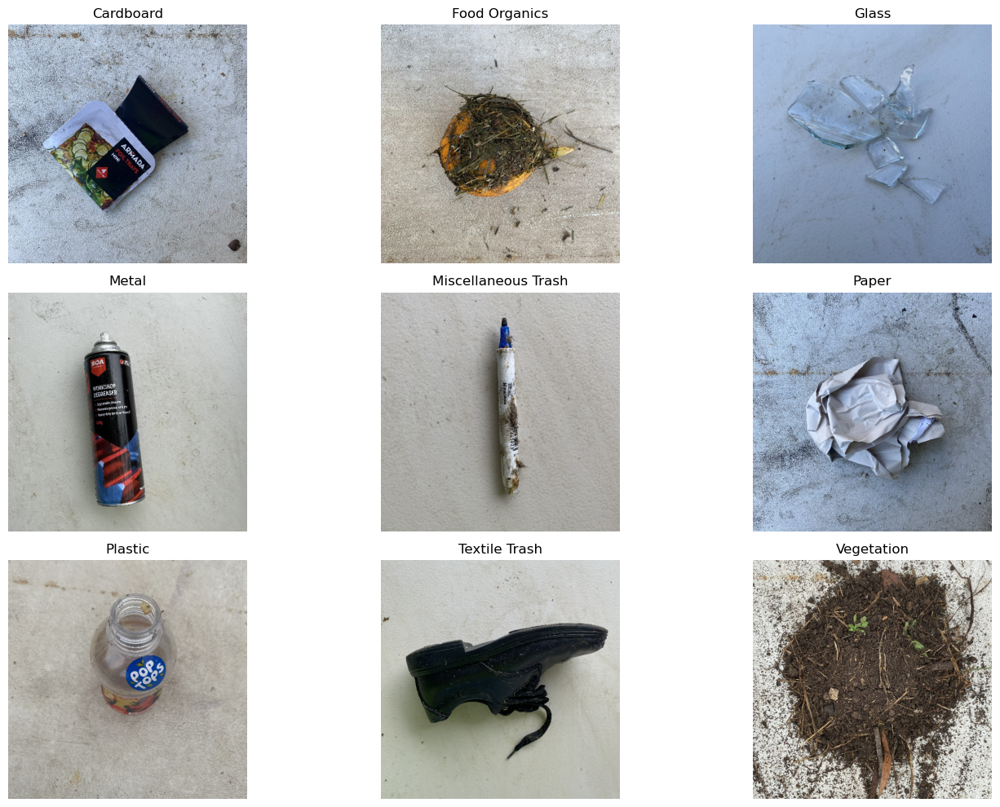

In [26]:
# Display one sample image per class
plt.figure(figsize=(15, 10))

for i, cls in enumerate(classes):
    class_path = os.path.join(DATASET_DIR, cls)
    img_name = random.choice(os.listdir(class_path))
    img_path = os.path.join(class_path, img_name)

    img = plt.imread(img_path)

    plt.subplot(3, 3, i+1)
    plt.imshow(img)
    plt.title(cls)
    plt.axis("off")

plt.tight_layout()
plt.show()

In [27]:
from tensorflow.keras.preprocessing import image
import os, random

# Select random image
cls = random.choice(classes)
img_name = random.choice(os.listdir(os.path.join(DATASET_DIR, cls)))
img_path = os.path.join(DATASET_DIR, cls, img_name)

# Load image (original)
img = image.load_img(img_path)
img_array = image.img_to_array(img)

print("Original Image Shape:", img_array.shape)
print("Height:", img_array.shape[0])
print("Width :", img_array.shape[1])
print("Channels:", img_array.shape[2])

Original Image Shape: (524, 524, 3)
Height: 524
Width : 524
Channels: 3


**4. Dataset Split**

In [28]:
import os
import shutil
import random

random.seed(42)

dataset_path = "RealWaste" 
output_path = "split_dataset"

if os.path.exists(output_path):
    print("Split already exists. Skipping splitting.")
else:
    splits = {"train": 0.7, "val": 0.15, "test": 0.15}

    for split in splits:
        for cls in os.listdir(dataset_path):
            os.makedirs(os.path.join(output_path, split, cls), exist_ok=True)

    for cls in os.listdir(dataset_path):
        class_path = os.path.join(dataset_path, cls)

        images = [img for img in os.listdir(class_path)
                  if img.lower().endswith(('.png', '.jpg', '.jpeg'))]

        random.shuffle(images)

        total = len(images)
        train_end = int(0.7 * total)
        val_end = int(0.85 * total)

        train_imgs = images[:train_end]
        val_imgs = images[train_end:val_end]
        test_imgs = images[val_end:]

        for img in train_imgs:
            shutil.copy(os.path.join(class_path, img),
                        os.path.join(output_path, "train", cls, img))

        for img in val_imgs:
            shutil.copy(os.path.join(class_path, img),
                        os.path.join(output_path, "val", cls, img))

        for img in test_imgs:
            shutil.copy(os.path.join(class_path, img),
                        os.path.join(output_path, "test", cls, img))

    print("Dataset split completed!")

Split already exists. Skipping splitting.


Check Total Image Count Consistency

In [29]:
def count_total_images(path):
    total = 0
    for cls in os.listdir(path):
        total += len(os.listdir(os.path.join(path, cls)))
    return total

original_total = count_total_images("RealWaste")
split_total = (
    count_total_images("split_dataset/train") +
    count_total_images("split_dataset/val") +
    count_total_images("split_dataset/test")
)

print("Original Dataset:", original_total)
print("After Split:", split_total)

Original Dataset: 4752
After Split: 4752


Verify Class-wise Distribution

In [30]:
def get_class_distribution(path):
    dist = {}
    for cls in os.listdir(path):
        dist[cls] = len(os.listdir(os.path.join(path, cls)))
    return dist

train_dist = get_class_distribution("split_dataset/train")
val_dist = get_class_distribution("split_dataset/val")
test_dist = get_class_distribution("split_dataset/test")

print("Train:\n", train_dist)
print("\nValidation:\n", val_dist)
print("\nTest:\n", test_dist)

Train:
 {'Cardboard': 322, 'Food Organics': 287, 'Glass': 294, 'Metal': 553, 'Miscellaneous Trash': 346, 'Paper': 350, 'Plastic': 644, 'Textile Trash': 222, 'Vegetation': 305}

Validation:
 {'Cardboard': 69, 'Food Organics': 62, 'Glass': 63, 'Metal': 118, 'Miscellaneous Trash': 74, 'Paper': 75, 'Plastic': 138, 'Textile Trash': 48, 'Vegetation': 65}

Test:
 {'Cardboard': 70, 'Food Organics': 62, 'Glass': 63, 'Metal': 119, 'Miscellaneous Trash': 75, 'Paper': 75, 'Plastic': 139, 'Textile Trash': 48, 'Vegetation': 66}


Check for Data Leakage

In [31]:
def get_all_images(path):
    images = set()
    for cls in os.listdir(path):
        for img in os.listdir(os.path.join(path, cls)):
            images.add(img)
    return images

train_imgs = get_all_images("split_dataset/train")
val_imgs = get_all_images("split_dataset/val")
test_imgs = get_all_images("split_dataset/test")

# Check overlaps
print("Train ∩ Val:", len(train_imgs.intersection(val_imgs)))
print("Train ∩ Test:", len(train_imgs.intersection(test_imgs)))
print("Val ∩ Test:", len(val_imgs.intersection(test_imgs)))

Train ∩ Val: 0
Train ∩ Test: 0
Val ∩ Test: 0


Visual Verification

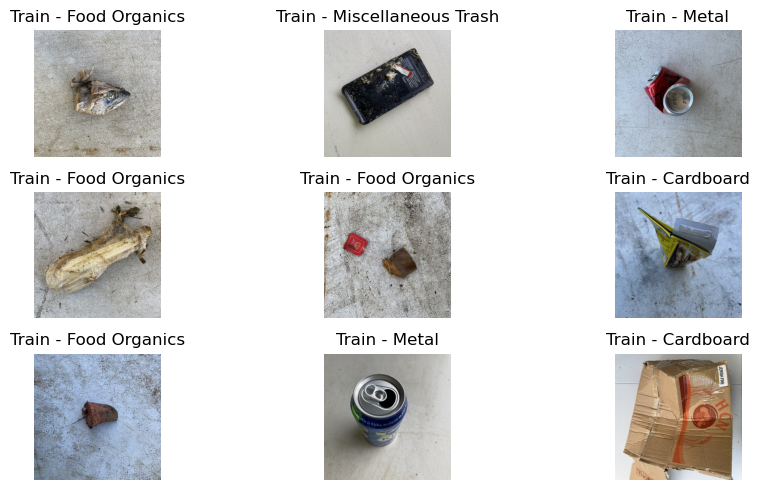

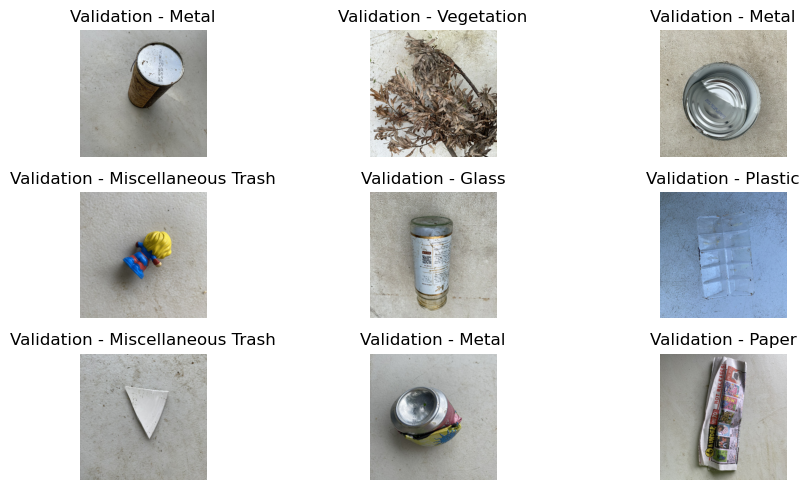

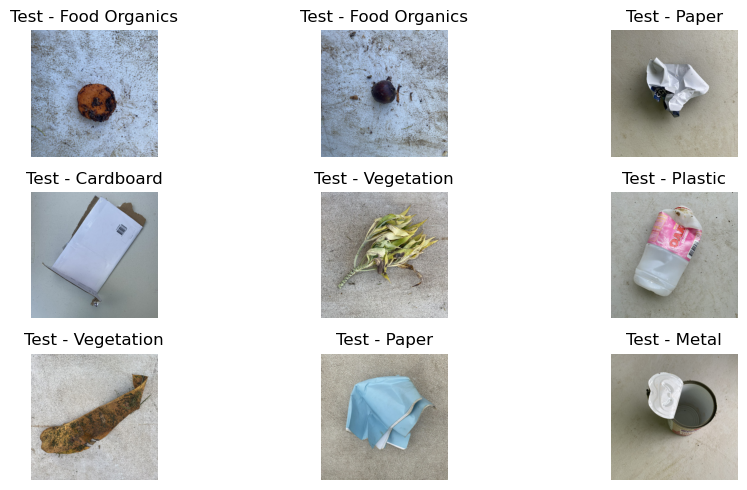

In [32]:
import matplotlib.pyplot as plt
import random

def show_random_images(path, title):
    plt.figure(figsize=(10, 5))
    classes = os.listdir(path)

    for i in range(9):
        cls = random.choice(classes)
        img_name = random.choice(os.listdir(os.path.join(path, cls)))
        img_path = os.path.join(path, cls, img_name)

        img = plt.imread(img_path)

        plt.subplot(3, 3, i+1)
        plt.imshow(img)
        plt.title(f"{title} - {cls}")
        plt.axis("off")

    plt.tight_layout()
    plt.show()

show_random_images("split_dataset/train", "Train")
show_random_images("split_dataset/val", "Validation")
show_random_images("split_dataset/test", "Test")

The dataset was manually partitioned into training (70%), validation (15%), and test (15%) subsets with class-wise stratification. Data leakage was prevented by ensuring zero overlap between splits, and distribution consistency was verified through statistical and visual inspection.

**5. Data Preprocessing and Data Augmentation**

In [33]:
train_dir = "split_dataset/train"
val_dir = "split_dataset/val"
test_dir = "split_dataset/test"

In [34]:
IMG_SIZE = (224, 224)
BATCH_SIZE = 32

train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=20,
    zoom_range=0.2,
    horizontal_flip=True,
    shear_range=0.1
)

val_test_datagen = ImageDataGenerator(rescale=1./255)

In [35]:
# Resize to model input size
img_resized = image.load_img(img_path, target_size=(224, 224))
img_resized_array = image.img_to_array(img_resized)

print("Resized Image Shape:", img_resized_array.shape)

Resized Image Shape: (224, 224, 3)


Original Shape: (524, 524, 3)
Resized Shape : (224, 224, 3)


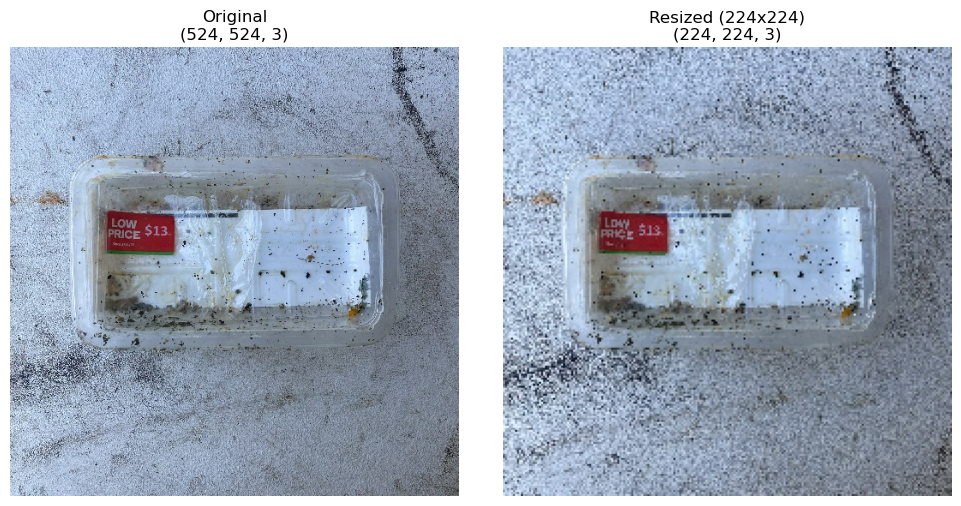

In [233]:
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing import image
import os, random

# Select random image
cls = random.choice(classes)
img_name = random.choice(os.listdir(os.path.join(DATASET_DIR, cls)))
img_path = os.path.join(DATASET_DIR, cls, img_name)

# Load original image
original_img = image.load_img(img_path)
original_array = image.img_to_array(original_img)

# Load resized image
resized_img = image.load_img(img_path, target_size=(224, 224))
resized_array = image.img_to_array(resized_img)

# Print shapes
print("Original Shape:", original_array.shape)
print("Resized Shape :", resized_array.shape)

# Plot side-by-side
plt.figure(figsize=(10, 5))

# Original
plt.subplot(1, 2, 1)
plt.imshow(original_array.astype("uint8"))
plt.title(f"Original\n{original_array.shape}")
plt.axis("off")

# Resized
plt.subplot(1, 2, 2)
plt.imshow(resized_array.astype("uint8"))
plt.title(f"Resized (224x224)\n{resized_array.shape}")
plt.axis("off")

plt.tight_layout()
plt.show()

Original shape: (524, 524, 3)
Pixel range: 0.0 - 255.0


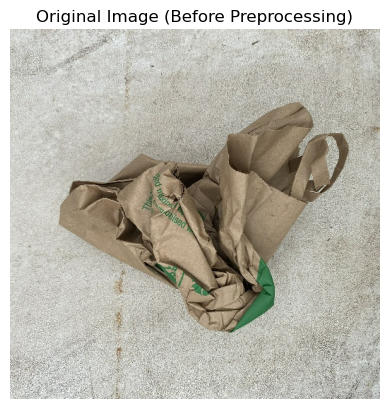

In [242]:
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing import image
import numpy as np
import random

# Pick random class and image
cls = random.choice(classes)
img_name = random.choice(os.listdir(os.path.join(DATASET_DIR, cls)))
img_path = os.path.join(DATASET_DIR, cls, img_name)

# Load original image
img = image.load_img(img_path)
img_array = image.img_to_array(img)

print("Original shape:", img_array.shape)
print("Pixel range:", img_array.min(), "-", img_array.max())

plt.imshow(img_array.astype("uint8"))
plt.title("Original Image (Before Preprocessing)")
plt.axis("off")
plt.show()

Resized shape: (224, 224, 3)
Pixel range: 0.0 - 1.0


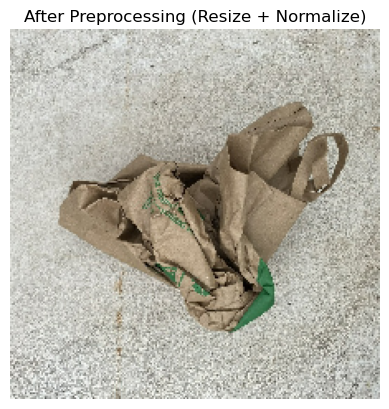

In [243]:
# Resize to 224x224
img_resized = image.load_img(img_path, target_size=(224, 224))
img_resized_array = image.img_to_array(img_resized)

# Normalize
img_normalized = img_resized_array / 255.0

print("Resized shape:", img_normalized.shape)
print("Pixel range:", img_normalized.min(), "-", img_normalized.max())

plt.imshow(img_normalized)
plt.title("After Preprocessing (Resize + Normalize)")
plt.axis("off")
plt.show()

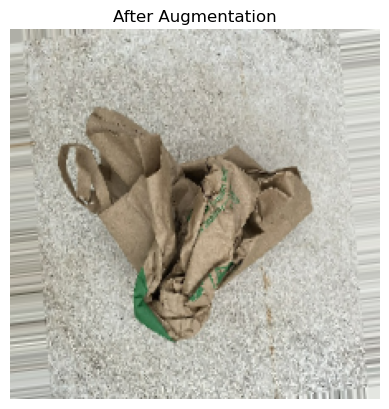

In [244]:
# Expand dims (required for generator)
img_batch = np.expand_dims(img_resized_array, axis=0)

# Apply augmentation
aug_iter = train_datagen.flow(img_batch, batch_size=1)

augmented_img = next(aug_iter)[0]

plt.imshow(augmented_img)
plt.title("After Augmentation")
plt.axis("off")
plt.show()

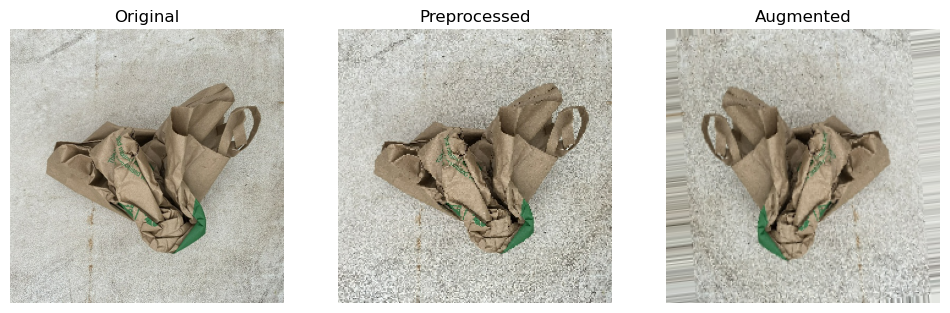

In [245]:
plt.figure(figsize=(12,4))

# Original
plt.subplot(1,3,1)
plt.imshow(img_array.astype("uint8"))
plt.title("Original")
plt.axis("off")

# Preprocessed
plt.subplot(1,3,2)
plt.imshow(img_normalized)
plt.title("Preprocessed")
plt.axis("off")

# Augmented
plt.subplot(1,3,3)
plt.imshow(augmented_img)
plt.title("Augmented")
plt.axis("off")

plt.show()

In [41]:
train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical'
)

val_generator = val_test_datagen.flow_from_directory(
    val_dir,
    target_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical'
)

test_generator = val_test_datagen.flow_from_directory(
    test_dir,
    target_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    shuffle=False
)

Found 3323 images belonging to 9 classes.
Found 712 images belonging to 9 classes.
Found 717 images belonging to 9 classes.


In [42]:
print(train_generator.class_indices)

{'Cardboard': 0, 'Food Organics': 1, 'Glass': 2, 'Metal': 3, 'Miscellaneous Trash': 4, 'Paper': 5, 'Plastic': 6, 'Textile Trash': 7, 'Vegetation': 8}


In [43]:
images, labels = next(train_generator)

print("Image batch shape:", images.shape)
print("Label batch shape:", labels.shape)

Image batch shape: (32, 224, 224, 3)
Label batch shape: (32, 9)


**6: Build CBAM**

In [2]:
import tensorflow as tf
from tensorflow.keras import layers

In [3]:
# Custom Layer: Channel Average Pooling
class ChannelAvgPool(layers.Layer):
    def call(self, inputs):
        return tf.reduce_mean(inputs, axis=3, keepdims=True)

# Custom Layer: Channel Max Pooling
class ChannelMaxPool(layers.Layer):
    def call(self, inputs):
        return tf.reduce_max(inputs, axis=3, keepdims=True)

**6.1: Channel Attention**

In [4]:
from tensorflow.keras import layers

def channel_attention(input_feature, ratio=8):
    channel = input_feature.shape[-1]

    # Global Average Pooling
    avg_pool = layers.GlobalAveragePooling2D()(input_feature)
    avg_pool = layers.Reshape((1, 1, channel))(avg_pool)

    # Global Max Pooling
    max_pool = layers.GlobalMaxPooling2D()(input_feature)
    max_pool = layers.Reshape((1, 1, channel))(max_pool)

    # Shared MLP
    shared_dense_1 = layers.Dense(channel // ratio, activation='relu')
    shared_dense_2 = layers.Dense(channel)

    avg_out = shared_dense_2(shared_dense_1(avg_pool))
    max_out = shared_dense_2(shared_dense_1(max_pool))

    # Combine
    cbam_feature = layers.Add()([avg_out, max_out])
    cbam_feature = layers.Activation('sigmoid')(cbam_feature)

    # Scale input feature
    return layers.Multiply()([input_feature, cbam_feature])

**6.2: Spatial Attention**

In [5]:
def spatial_attention(input_feature):

    # Use custom layers instead of Lambda
    avg_pool = ChannelAvgPool()(input_feature)
    max_pool = ChannelMaxPool()(input_feature)

    # Concatenate along channel axis
    concat = layers.Concatenate(axis=3)([avg_pool, max_pool])

    # Apply convolution
    cbam_feature = layers.Conv2D(
        filters=1,
        kernel_size=7,
        padding='same',
        activation='sigmoid'
    )(concat)

    # Multiply with input feature
    return layers.Multiply()([input_feature, cbam_feature])

**6.3: Combine → CBAM Block**

In [6]:
def cbam_block(input_feature, ratio=8):
    
    x = channel_attention(input_feature, ratio)
    x = spatial_attention(x)
    
    return x

CBAM is applied to the feature maps prior to global pooling to enhance both channel-wise and spatial feature representations, enabling the model to focus on discriminative regions and informative feature channels

**7: Load Pretrained Models**

In [7]:
from tensorflow.keras import layers, Model

# Input layer
input_tensor = layers.Input(shape=(224, 224, 3))

In [8]:
from tensorflow.keras.applications import ResNet50

resnet = ResNet50(
    weights='imagenet',
    include_top=False,
    input_tensor=input_tensor
)

print("ResNet50 Output Shape:", resnet.output.shape)

ResNet50 Output Shape: (None, 7, 7, 2048)


In [9]:
from tensorflow.keras.applications import MobileNetV2

mobilenet = MobileNetV2(
    weights='imagenet',
    include_top=False,
    input_tensor=input_tensor
)

print("MobileNetV2 Output Shape:", mobilenet.output.shape)

C:\Users\Admin\AppData\Local\Temp\ipykernel_10872\3450224033.py:3: UserWarning: `input_shape` is undefined or non-square, or `rows` is not in [96, 128, 160, 192, 224]. Weights for input shape (224, 224) will be loaded as the default.
  mobilenet = MobileNetV2(


MobileNetV2 Output Shape: (None, 7, 7, 1280)


In [10]:
from tensorflow.keras.applications import EfficientNetB0

efficientnet = EfficientNetB0(
    weights='imagenet',
    include_top=False,
    input_tensor=input_tensor
)

print("EfficientNetB0 Output Shape:", efficientnet.output.shape)

EfficientNetB0 Output Shape: (None, 7, 7, 1280)


In [11]:
# Freeze all layers
for model in [resnet, mobilenet, efficientnet]:
    for layer in model.layers:
        layer.trainable = False

print("All base models frozen!")

All base models frozen!


In [13]:
resnet_features = resnet.output
mobilenet_features = mobilenet.output
efficientnet_features = efficientnet.output

print("ResNet Feature Shape:", resnet_features.shape)
print("MobileNet Feature Shape:", mobilenet_features.shape)
print("EfficientNet Feature Shape:", efficientnet_features.shape)

ResNet Feature Shape: (None, 7, 7, 2048)
MobileNet Feature Shape: (None, 7, 7, 1280)
EfficientNet Feature Shape: (None, 7, 7, 1280)


Multiple pretrained backbones are used in parallel to extract complementary feature representations, leveraging architectural diversity to enhance classification performance.

**8: Apply CBAM to feature maps from each model**

In [14]:
# Apply CBAM to each backbone

resnet_cbam = cbam_block(resnet_features)
mobilenet_cbam = cbam_block(mobilenet_features)
efficientnet_cbam = cbam_block(efficientnet_features)

print("ResNet CBAM Shape:", resnet_cbam.shape)
print("MobileNet CBAM Shape:", mobilenet_cbam.shape)
print("EfficientNet CBAM Shape:", efficientnet_cbam.shape)


ResNet CBAM Shape: (None, 7, 7, 2048)
MobileNet CBAM Shape: (None, 7, 7, 1280)
EfficientNet CBAM Shape: (None, 7, 7, 1280)


CBAM is applied to the convolutional feature maps prior to global pooling to preserve spatial information and enhance discriminative feature learning through channel-wise and spatial attention mechanisms

**9: Feature Extraction and Global Average Pooling**

In [15]:
from tensorflow.keras import layers

# Apply Global Average Pooling
resnet_gap = layers.GlobalAveragePooling2D()(resnet_cbam)
mobilenet_gap = layers.GlobalAveragePooling2D()(mobilenet_cbam)
efficientnet_gap = layers.GlobalAveragePooling2D()(efficientnet_cbam)

print("ResNet GAP Shape:", resnet_gap.shape)
print("MobileNet GAP Shape:", mobilenet_gap.shape)
print("EfficientNet GAP Shape:", efficientnet_gap.shape)

ResNet GAP Shape: (None, 2048)
MobileNet GAP Shape: (None, 1280)
EfficientNet GAP Shape: (None, 1280)


Global Average Pooling is applied to reduce spatial dimensions and convert feature maps into compact feature vectors while preserving channel-wise information and reducing the risk of overfitting

**10: Feature Fusion**

In [16]:
from tensorflow.keras import layers

# Feature Fusion (Concatenation)
fused_features = layers.Concatenate()([
    resnet_gap,
    mobilenet_gap,
    efficientnet_gap
])

print("Fused Feature Shape:", fused_features.shape)

Fused Feature Shape: (None, 4608)


Feature-level fusion is performed by concatenating the global feature vectors extracted from multiple backbone networks, enabling the model to leverage complementary representations for improved classification performance.

**11: Build Classification Head**

In [44]:
# Number of classes
num_classes = train_generator.num_classes

# Dense Layer
x = layers.Dense(512)(fused_features)

# Batch Normalization
x = layers.BatchNormalization()(x)

# Activation
x = layers.Activation('relu')(x)

# Dropout
x = layers.Dropout(0.5)(x)

# Output Layer
output = layers.Dense(num_classes, activation='softmax')(x)

# Print shape
print("Output Shape:", output.shape)

Output Shape: (None, 9)


A fully connected classification head comprising Dense, Batch Normalization, ReLU activation, and Dropout layers is used to learn high-level feature interactions and prevent overfitting, followed by a Softmax layer for multi-class prediction.

**12: Compile Model**

In [45]:
# Create full model
model = Model(inputs=input_tensor, outputs=output)

# Display summary
model.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ rescaling           │ (None, 224, 224,  │          0 │ input_layer[0][0] │
│ (Rescaling)         │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ normalization       │ (None, 224, 224,  │          7 │ rescaling[0][0]   │
│ (Normalization)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ rescaling_1         │ (None, 224, 224,  │          0 │ normalization[0]… │
│ (Rescaling)         │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_conv_pad       │ (None, 225, 225,  │          0 │ rescaling_1[0][0] │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_conv (Conv2D)  │ (None, 112, 112,  │        864 │ stem_conv_pad[0]… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_bn             │ (None, 112, 112,  │        128 │ stem_conv[0][0]   │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_activation     │ (None, 112, 112,  │          0 │ stem_bn[0][0]     │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_dwconv      │ (None, 112, 112,  │        288 │ stem_activation[… │
│ (DepthwiseConv2D)   │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_bn          │ (None, 112, 112,  │        128 │ block1a_dwconv[0… │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_activation  │ (None, 112, 112,  │          0 │ block1a_bn[0][0]  │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_squeeze  │ (None, 32)        │          0 │ block1a_activati… │
│ (GlobalAveragePool… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_reshape  │ (None, 1, 1, 32)  │          0 │ block1a_se_squee… │
│ (Reshape)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_reduce   │ (None, 1, 1, 8)   │        264 │ block1a_se_resha… │
│ (Conv2D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_expand   │ (None, 1, 1, 32)  │        288 │ block1a_se_reduc… │
│ (Conv2D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_excite   │ (None, 112, 112,  │          0 │ block1a_activati… │
│ (Multiply)          │ 32)               │            │ block1a_se_expan… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_project_co… │ (None, 112, 112,  │        512 │ block1a_se_excit

 Total params: 34,134,997 (130.21 MB)

 Trainable params: 4,238,706 (16.17 MB)

 Non-trainable params: 29,896,291 (114.05 MB)

In [52]:
from tensorflow.keras.metrics import Precision, Recall
from tensorflow.keras.optimizers import Adam

model.compile(
    optimizer=Adam(learning_rate=1e-4),
    loss='categorical_crossentropy',
    metrics=[
        'accuracy',
        Precision(name='precision'),
        Recall(name='recall')
    ]
)

The model is compiled using the Adam optimizer with a learning rate of 1e-4, categorical crossentropy loss for multi-class classification, and evaluation metrics including accuracy, precision, and recall to ensure comprehensive performance assessment

**13: Train Model**

In [53]:
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint

# Early stopping
early_stop = EarlyStopping(
    monitor='val_loss',
    patience=5,
    restore_best_weights=True
)

# Reduce learning rate
reduce_lr = ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.3,
    patience=3,
    min_lr=1e-6
)

# Save best model
checkpoint = ModelCheckpoint(
    "best_model.keras",
    monitor='val_accuracy',
    save_best_only=True
)

In [54]:
EPOCHS = 30

history = model.fit(
    train_generator,
    validation_data=val_generator,
    epochs=EPOCHS,
    callbacks=[early_stop, reduce_lr, checkpoint]
)

Epoch 1/30
104/104 ━━━━━━━━━━━━━━━━━━━━ 575s 5s/step - accuracy: 0.4162 - loss: 1.7417 - precision: 0.5578 - recall: 0.2862 - val_accuracy: 0.6152 - val_loss: 1.4780 - val_precision: 1.0000 - val_recall: 0.0492 - learning_rate: 1.0000e-04
Epoch 2/30
104/104 ━━━━━━━━━━━━━━━━━━━━ 542s 5s/step - accuracy: 0.6286 - loss: 1.0884 - precision: 0.7287 - recall: 0.5230 - val_accuracy: 0.6952 - val_loss: 1.0554 - val_precision: 0.8963 - val_recall: 0.3764 - learning_rate: 1.0000e-04
Epoch 3/30
104/104 ━━━━━━━━━━━━━━━━━━━━ 548s 5s/step - accuracy: 0.6924 - loss: 0.8660 - precision: 0.7897 - recall: 0.6112 - val_accuracy: 0.7346 - val_loss: 0.8022 - val_precision: 0.8491 - val_recall: 0.5927 - learning_rate: 1.0000e-04
Epoch 4/30
104/104 ━━━━━━━━━━━━━━━━━━━━ 494s 5s/step - accuracy: 0.7298 - loss: 0.7593 - precision: 0.8033 - recall: 0.6599 - val_accuracy: 0.7640 - val_loss: 0.7276 - val_precision: 0.8530 - val_recall: 0.6685 - learning_rate: 1.0000e-04
Epoch 5/30
104/104 ━━━━━━━━━━━━━━━━━━━━ 532s

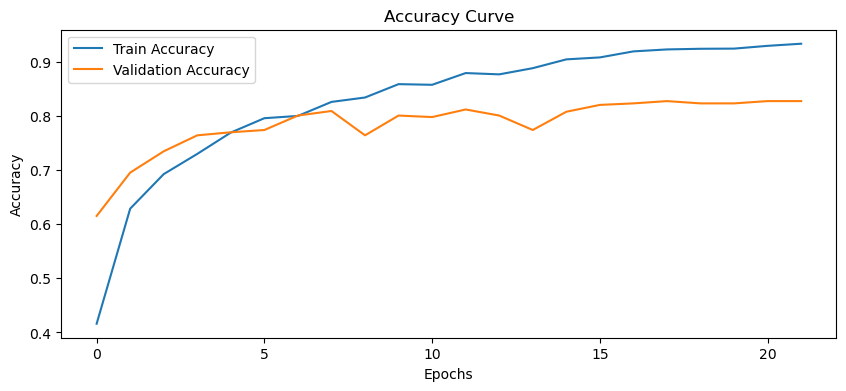

In [55]:
plt.figure(figsize=(10,4))

plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')

plt.title("Accuracy Curve")
plt.xlabel("Epochs")
plt.ylabel("Accuracy")
plt.legend()

plt.show()

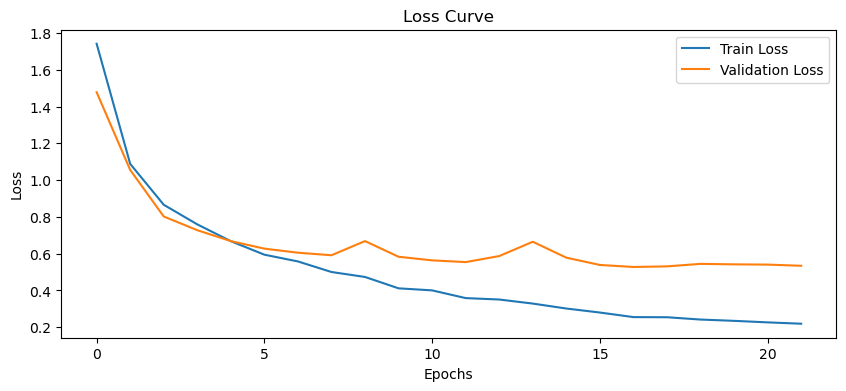

In [56]:
plt.figure(figsize=(10,4))

plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')

plt.title("Loss Curve")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.legend()

plt.show()

The model is trained using early stopping and adaptive learning rate scheduling to prevent overfitting and improve convergence, while the best-performing model is saved using checkpointing

In [57]:
model.load_weights("best_model.keras")
print("✅ Best weights loaded!")

✅ Best weights loaded!


In [58]:
test_loss, test_acc, test_precision, test_recall = model.evaluate(test_generator)

print("\n📊 Test Results:")
print("Test Accuracy :", test_acc)
print("Test Precision:", test_precision)
print("Test Recall   :", test_recall)

23/23 ━━━━━━━━━━━━━━━━━━━━ 70s 3s/step - accuracy: 0.8215 - loss: 0.5350 - precision: 0.8388 - recall: 0.7838

📊 Test Results:
Test Accuracy : 0.8214783668518066
Test Precision: 0.8388059735298157
Test Recall   : 0.7838214635848999


In [310]:
test_loss, test_acc, test_precision, test_recall = model.evaluate(test_generator)

print("\n📊 Test Results:")
print("Test Accuracy :", test_acc)
print("Test Precision:", test_precision)
print("Test Recall   :", test_recall)
print("Test loss   :", test_loss)

23/23 ━━━━━━━━━━━━━━━━━━━━ 107s 4s/step - accuracy: 0.8215 - loss: 0.5350 - precision: 0.8388 - recall: 0.7838

📊 Test Results:
Test Accuracy : 0.8214783668518066
Test Precision: 0.8388059735298157
Test Recall   : 0.7838214635848999
Test loss   : 0.5350379347801208


In [59]:
import numpy as np

# Predict probabilities
y_pred_probs = model.predict(test_generator)

# Convert to class labels
y_pred = np.argmax(y_pred_probs, axis=1)

# True labels
y_true = test_generator.classes

23/23 ━━━━━━━━━━━━━━━━━━━━ 79s 3s/step


In [60]:
class_labels = list(test_generator.class_indices.keys())
print(class_labels)

['Cardboard', 'Food Organics', 'Glass', 'Metal', 'Miscellaneous Trash', 'Paper', 'Plastic', 'Textile Trash', 'Vegetation']


In [61]:
from sklearn.metrics import classification_report

report = classification_report(y_true, y_pred, target_names=class_labels)
print(report)

                     precision    recall  f1-score   support

          Cardboard       0.79      0.87      0.83        70
      Food Organics       0.89      0.87      0.88        62
              Glass       0.76      0.76      0.76        63
              Metal       0.80      0.87      0.83       119
Miscellaneous Trash       0.74      0.65      0.70        75
              Paper       0.84      0.81      0.82        75
            Plastic       0.82      0.78      0.80       139
      Textile Trash       0.86      0.88      0.87        48
         Vegetation       0.93      0.94      0.93        66

           accuracy                           0.82       717
          macro avg       0.82      0.83      0.82       717
       weighted avg       0.82      0.82      0.82       717



In [62]:
from sklearn.metrics import confusion_matrix

cm = confusion_matrix(y_true, y_pred)
print(cm)

[[ 61   0   0   0   2   4   3   0   0]
 [  0  54   1   0   3   0   0   0   4]
 [  1   0  48   9   0   0   5   0   0]
 [  1   0   3 103   4   2   6   0   0]
 [  2   3   2   2  49   1   8   7   1]
 [  6   0   1   4   2  61   1   0   0]
 [  6   1   7  10   4   2 109   0   0]
 [  0   0   1   0   1   3   1  42   0]
 [  0   3   0   0   1   0   0   0  62]]


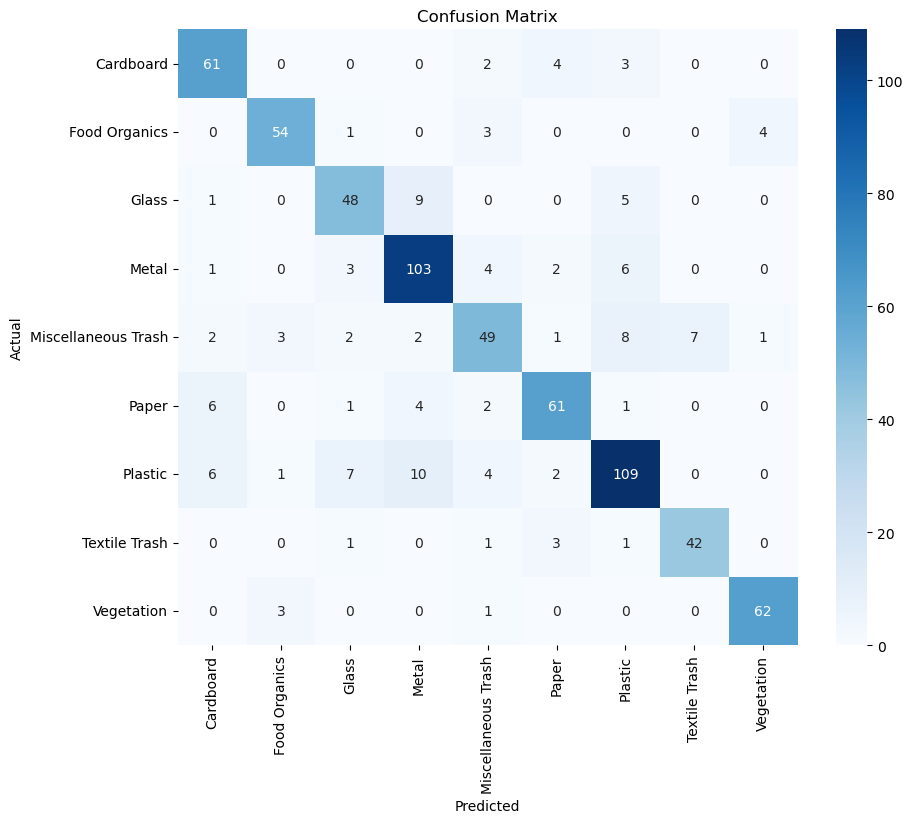

In [63]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(10,8))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=class_labels,
            yticklabels=class_labels)

plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix")
plt.show()

**15: Visualization**

In [64]:
# Get file paths
file_paths = test_generator.filepaths

In [65]:
import numpy as np

misclassified_indices = np.where(y_pred != y_true)[0]

print("Total Misclassified:", len(misclassified_indices))

Total Misclassified: 128


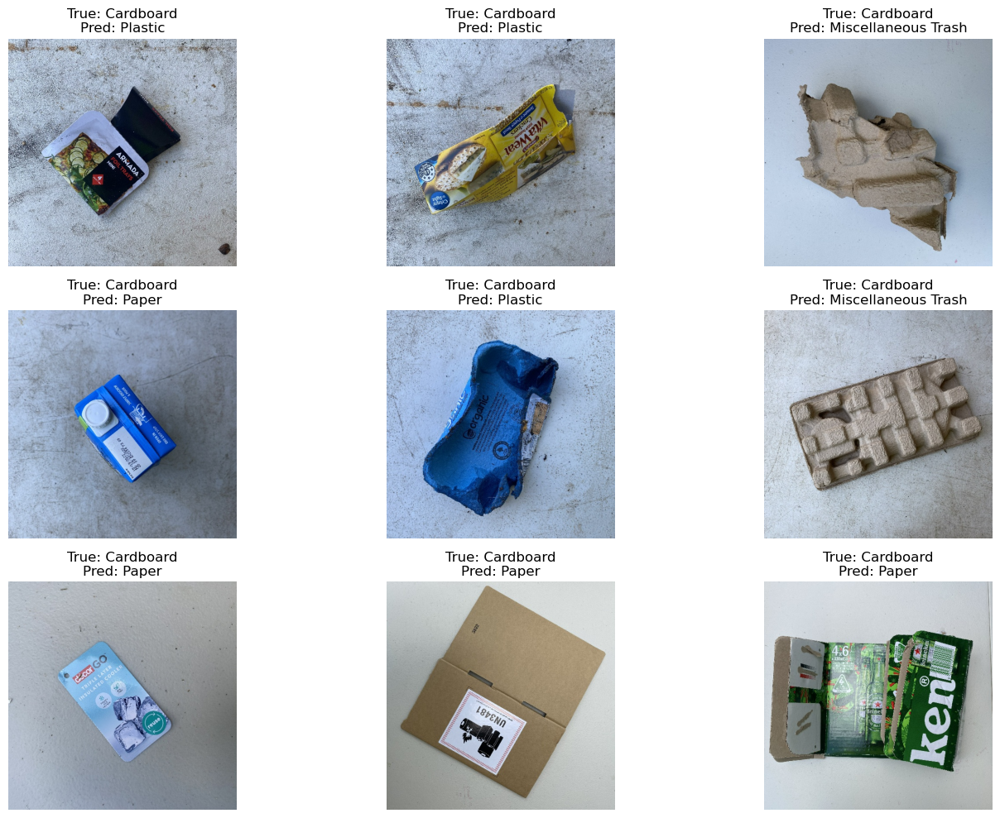

In [66]:
import matplotlib.pyplot as plt
import cv2

plt.figure(figsize=(15,10))

for i, idx in enumerate(misclassified_indices[:9]):  # show first 9
    img_path = file_paths[idx]
    
    # Read image
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    # Labels
    true_label = class_labels[y_true[idx]]
    pred_label = class_labels[y_pred[idx]]
    
    # Plot
    plt.subplot(3, 3, i+1)
    plt.imshow(img)
    plt.title(f"True: {true_label}\nPred: {pred_label}")
    plt.axis('off')

plt.tight_layout()
plt.show()

**Testing**

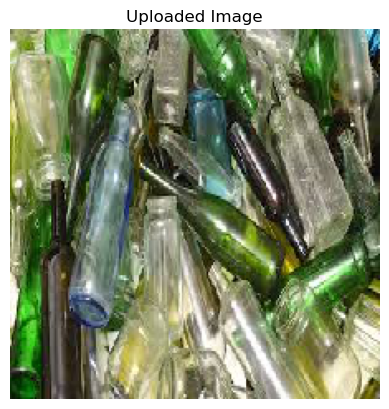

In [303]:
from tensorflow.keras.preprocessing import image
import numpy as np
import matplotlib.pyplot as plt

# Provide your image path
img_path = "g1.jpg"  

# Load image
img = image.load_img(img_path, target_size=(224, 224))

# Display image
plt.imshow(img)
plt.title("Uploaded Image")
plt.axis('off')
plt.show()

In [304]:
# Convert to array
img_array = image.img_to_array(img)

# Normalize (same as training)
img_array = img_array / 255.0

# Add batch dimension
img_array = np.expand_dims(img_array, axis=0)

print("Shape:", img_array.shape)

Shape: (1, 224, 224, 3)


In [305]:
# Predict
pred = model.predict(img_array)

# Get class index
pred_class = np.argmax(pred)

# Get label
class_labels = list(train_generator.class_indices.keys())
pred_label = class_labels[pred_class]

# Confidence
confidence = np.max(pred)

print(f"Predicted Class: {pred_label}")
print(f"Confidence: {confidence:.4f}")

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step
Predicted Class: Metal
Confidence: 0.6458


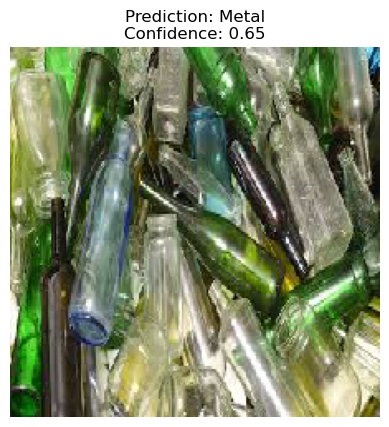

In [306]:
plt.imshow(img)
plt.title(f"Prediction: {pred_label}\nConfidence: {confidence:.2f}")
plt.axis('off')
plt.show()

In [307]:
# Predict probabilities
pred = model.predict(img_array)[0]   # shape: (num_classes,)

# Class labels
class_labels = list(train_generator.class_indices.keys())

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step


In [308]:
print("🔍 Class-wise Probabilities:\n")

for i, prob in enumerate(pred):
    print(f"{class_labels[i]}: {prob:.4f}")

🔍 Class-wise Probabilities:

Cardboard: 0.0006
Food Organics: 0.0269
Glass: 0.0048
Metal: 0.6458
Miscellaneous Trash: 0.0012
Paper: 0.0228
Plastic: 0.2017
Textile Trash: 0.0014
Vegetation: 0.0948


In [309]:
# Sort probabilities
sorted_indices = np.argsort(pred)[::-1]

print("🔝 Sorted Probabilities:\n")

for idx in sorted_indices:
    print(f"{class_labels[idx]}: {pred[idx]:.4f}")

🔝 Sorted Probabilities:

Metal: 0.6458
Plastic: 0.2017
Vegetation: 0.0948
Food Organics: 0.0269
Paper: 0.0228
Glass: 0.0048
Textile Trash: 0.0014
Miscellaneous Trash: 0.0012
Cardboard: 0.0006


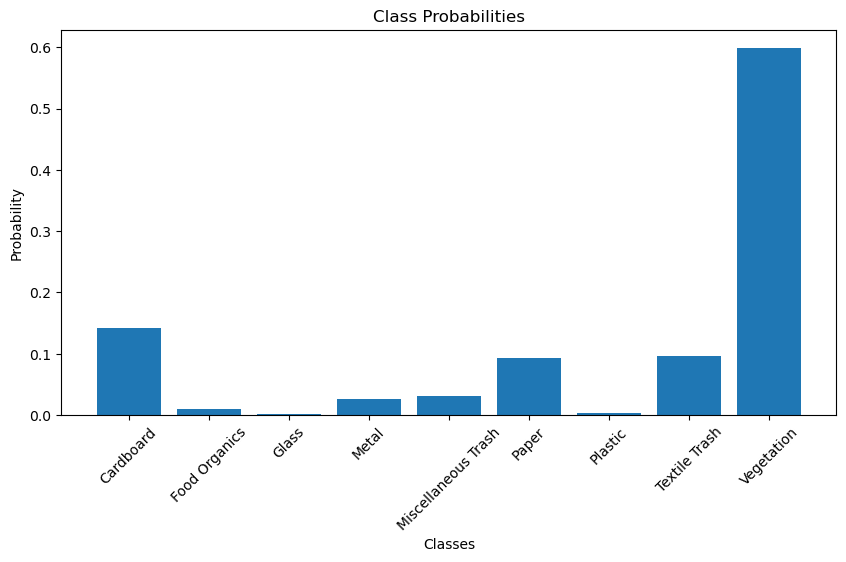

In [255]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10,5))
plt.bar(class_labels, pred)

plt.xticks(rotation=45)
plt.title("Class Probabilities")
plt.ylabel("Probability")
plt.xlabel("Classes")

plt.show()

In [84]:
# Save weights
model.save_weights("final_model.weights.h5")

print("✅ Model weights saved!")

✅ Model weights saved!


In [85]:
model.load_weights("final_model.weights.h5")

In [86]:
import os

print("File exists:", os.path.exists("final_model.weights.h5"))

File exists: True


In [87]:
pred1 = model.predict(img_array)
print(pred1)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step
[[6.4486987e-04 9.4900680e-01 5.9503538e-05 7.0768560e-04 1.0820648e-02
  7.1949940e-03 2.8089783e-04 6.4964416e-03 2.4788152e-02]]


**MODEL IMPROVEMENT**

In [1]:
import tensorflow as tf
from tensorflow.keras import layers, Model
from tensorflow.keras.applications import ResNet50, MobileNetV2, EfficientNetB0
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.metrics import Precision, Recall
import matplotlib.pyplot as plt
import numpy as np

**Preprocessing**

In [3]:
from tensorflow.keras.applications.efficientnet import preprocess_input

IMG_SIZE = (224, 224)
BATCH_SIZE = 32

train_datagen = ImageDataGenerator(
    preprocessing_function=preprocess_input, ##changed 
    rotation_range=20,
    zoom_range=0.2,
    horizontal_flip=True,
    brightness_range=[0.8, 1.2] ##Added , removed shear range
)

val_test_datagen = ImageDataGenerator(
    preprocessing_function=preprocess_input
)

**Data Generators**

In [4]:
train_generator = train_datagen.flow_from_directory(
    "split_dataset/train",
    target_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical'
)

val_generator = val_test_datagen.flow_from_directory(
    "split_dataset/val",
    target_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical'
)

test_generator = val_test_datagen.flow_from_directory(
    "split_dataset/test",
    target_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    shuffle=False
)

num_classes = train_generator.num_classes

Found 3323 images belonging to 9 classes.
Found 712 images belonging to 9 classes.
Found 717 images belonging to 9 classes.


**CBAM**

In [5]:
class ChannelAvgPool(layers.Layer):
    def call(self, inputs):
        return tf.reduce_mean(inputs, axis=3, keepdims=True)

class ChannelMaxPool(layers.Layer):
    def call(self, inputs):
        return tf.reduce_max(inputs, axis=3, keepdims=True)

def channel_attention(input_feature, ratio=8):
    channel = input_feature.shape[-1]

    avg_pool = layers.GlobalAveragePooling2D()(input_feature)
    avg_pool = layers.Reshape((1, 1, channel))(avg_pool)

    max_pool = layers.GlobalMaxPooling2D()(input_feature)
    max_pool = layers.Reshape((1, 1, channel))(max_pool)

    shared_dense_1 = layers.Dense(channel // ratio, activation='relu')
    shared_dense_2 = layers.Dense(channel)

    avg_out = shared_dense_2(shared_dense_1(avg_pool))
    max_out = shared_dense_2(shared_dense_1(max_pool))

    cbam_feature = layers.Add()([avg_out, max_out])
    cbam_feature = layers.Activation('sigmoid')(cbam_feature)

    return layers.Multiply()([input_feature, cbam_feature])

def spatial_attention(input_feature):
    avg_pool = ChannelAvgPool()(input_feature)
    max_pool = ChannelMaxPool()(input_feature)

    concat = layers.Concatenate(axis=3)([avg_pool, max_pool])

    cbam_feature = layers.Conv2D(1, 7, padding='same', activation='sigmoid')(concat)

    return layers.Multiply()([input_feature, cbam_feature])

def cbam_block(input_feature):
    x = channel_attention(input_feature)
    x = spatial_attention(x)
    return x

**Load Models (Frozen First)**

In [6]:
input_tensor = layers.Input(shape=(224, 224, 3))

resnet = ResNet50(weights='imagenet', include_top=False, input_tensor=input_tensor)
mobilenet = MobileNetV2(weights='imagenet', include_top=False, input_tensor=input_tensor)
efficientnet = EfficientNetB0(weights='imagenet', include_top=False, input_tensor=input_tensor)

# Freeze ALL layers initially
for model in [resnet, mobilenet, efficientnet]:
    for layer in model.layers:
        layer.trainable = False

C:\Users\Admin\AppData\Local\Temp\ipykernel_13660\1140951181.py:4: UserWarning: `input_shape` is undefined or non-square, or `rows` is not in [96, 128, 160, 192, 224]. Weights for input shape (224, 224) will be loaded as the default.
  mobilenet = MobileNetV2(weights='imagenet', include_top=False, input_tensor=input_tensor)


**Apply CBAM + Fusion**

In [7]:
resnet_cbam = cbam_block(resnet.output)
mobilenet_cbam = cbam_block(mobilenet.output)
efficientnet_cbam = cbam_block(efficientnet.output)

resnet_gap = layers.GlobalAveragePooling2D()(resnet_cbam)
mobilenet_gap = layers.GlobalAveragePooling2D()(mobilenet_cbam)
efficientnet_gap = layers.GlobalAveragePooling2D()(efficientnet_cbam)

fused = layers.Concatenate()([resnet_gap, mobilenet_gap, efficientnet_gap])

**Improved Dense Head**

In [8]:
x = layers.Dense(512)(fused)
x = layers.BatchNormalization()(x)
x = layers.Activation('relu')(x)
x = layers.Dropout(0.5)(x)

x = layers.Dense(256, activation='relu')(x)

output = layers.Dense(num_classes, activation='softmax')(x)

model = Model(inputs=input_tensor, outputs=output)
model.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ rescaling           │ (None, 224, 224,  │          0 │ input_layer[0][0] │
│ (Rescaling)         │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ normalization       │ (None, 224, 224,  │          7 │ rescaling[0][0]   │
│ (Normalization)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ rescaling_1         │ (None, 224, 224,  │          0 │ normalization[0]… │
│ (Rescaling)         │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_conv_pad       │ (None, 225, 225,  │          0 │ rescaling_1[0][0] │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_conv (Conv2D)  │ (None, 112, 112,  │        864 │ stem_conv_pad[0]… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_bn             │ (None, 112, 112,  │        128 │ stem_conv[0][0]   │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_activation     │ (None, 112, 112,  │          0 │ stem_bn[0][0]     │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_dwconv      │ (None, 112, 112,  │        288 │ stem_activation[… │
│ (DepthwiseConv2D)   │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_bn          │ (None, 112, 112,  │        128 │ block1a_dwconv[0… │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_activation  │ (None, 112, 112,  │          0 │ block1a_bn[0][0]  │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_squeeze  │ (None, 32)        │          0 │ block1a_activati… │
│ (GlobalAveragePool… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_reshape  │ (None, 1, 1, 32)  │          0 │ block1a_se_squee… │
│ (Reshape)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_reduce   │ (None, 1, 1, 8)   │        264 │ block1a_se_resha… │
│ (Conv2D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_expand   │ (None, 1, 1, 32)  │        288 │ block1a_se_reduc… │
│ (Conv2D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_excite   │ (None, 112, 112,  │          0 │ block1a_activati… │
│ (Multiply)          │ 32)               │            │ block1a_se_expan… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_project_co… │ (None, 112, 112,  │        512 │ block1a_se_excit

 Total params: 34,264,021 (130.71 MB)

 Trainable params: 4,367,730 (16.66 MB)

 Non-trainable params: 29,896,291 (114.05 MB)

**Compile (Label Smoothing Added)**

In [9]:
model.compile(
    optimizer=Adam(learning_rate=1e-4),
    loss=tf.keras.losses.CategoricalCrossentropy(label_smoothing=0.1),
    metrics=['accuracy', Precision(), Recall()]
)

**Callbacks**

In [10]:
early_stop = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.3, patience=3, min_lr=1e-6)

checkpoint = ModelCheckpoint("best_model.keras", monitor='val_accuracy', save_best_only=True)

**INITIAL TRAINING**

In [11]:
history = model.fit(
    train_generator,
    validation_data=val_generator,
    epochs=20,
    callbacks=[early_stop, reduce_lr, checkpoint]
)

Epoch 1/20
104/104 ━━━━━━━━━━━━━━━━━━━━ 641s 6s/step - accuracy: 0.4583 - loss: 1.6880 - precision: 0.7159 - recall: 0.2275 - val_accuracy: 0.6966 - val_loss: 1.6731 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - learning_rate: 1.0000e-04
Epoch 2/20
104/104 ━━━━━━━━━━━━━━━━━━━━ 494s 5s/step - accuracy: 0.6876 - loss: 1.1934 - precision: 0.8341 - recall: 0.5191 - val_accuracy: 0.7739 - val_loss: 1.2841 - val_precision: 0.9843 - val_recall: 0.1756 - learning_rate: 1.0000e-04
Epoch 3/20
104/104 ━━━━━━━━━━━━━━━━━━━━ 474s 5s/step - accuracy: 0.7574 - loss: 1.0583 - precision: 0.8762 - recall: 0.6133 - val_accuracy: 0.7935 - val_loss: 1.0186 - val_precision: 0.9381 - val_recall: 0.5323 - learning_rate: 1.0000e-04
Epoch 4/20
104/104 ━━━━━━━━━━━━━━━━━━━━ 462s 4s/step - accuracy: 0.8038 - loss: 0.9741 - precision: 0.8956 - recall: 0.6840 - val_accuracy: 0.8202 - val_loss: 0.9298 - val_precision: 0.9108 - val_recall: 0.6742 - learning_rate: 1.0000e-04
Epoch 5/20
104/104 ━━━━━━━━━━━━━━━━━

**FINE-TUNING**

In [12]:
# Unfreeze LAST layers only
for base_model in [resnet, mobilenet, efficientnet]:
    for layer in base_model.layers[-30:]:
        layer.trainable = True

# Recompile with LOW LR
model.compile(
    optimizer=Adam(learning_rate=1e-5),
    loss=tf.keras.losses.CategoricalCrossentropy(label_smoothing=0.1),
    metrics=['accuracy', Precision(), Recall()]
)

In [13]:
history_finetune = model.fit(
    train_generator,
    validation_data=val_generator,
    epochs=10,
    callbacks=[early_stop, reduce_lr]
)

Epoch 1/10
104/104 ━━━━━━━━━━━━━━━━━━━━ 627s 6s/step - accuracy: 0.8255 - loss: 0.9499 - precision_1: 0.9273 - recall_1: 0.6605 - val_accuracy: 0.8680 - val_loss: 0.8779 - val_precision_1: 0.9019 - val_recall_1: 0.8132 - learning_rate: 1.0000e-05
Epoch 2/10
104/104 ━━━━━━━━━━━━━━━━━━━━ 560s 5s/step - accuracy: 0.8805 - loss: 0.8373 - precision_1: 0.9452 - recall_1: 0.7577 - val_accuracy: 0.8581 - val_loss: 0.9104 - val_precision_1: 0.8975 - val_recall_1: 0.7992 - learning_rate: 1.0000e-05
Epoch 3/10
104/104 ━━━━━━━━━━━━━━━━━━━━ 567s 5s/step - accuracy: 0.8938 - loss: 0.8046 - precision_1: 0.9484 - recall_1: 0.7963 - val_accuracy: 0.8610 - val_loss: 0.9083 - val_precision_1: 0.8962 - val_recall_1: 0.8006 - learning_rate: 1.0000e-05
Epoch 4/10
104/104 ━━━━━━━━━━━━━━━━━━━━ 580s 6s/step - accuracy: 0.9157 - loss: 0.7578 - precision_1: 0.9634 - recall_1: 0.8315 - val_accuracy: 0.8638 - val_loss: 0.8975 - val_precision_1: 0.8948 - val_recall_1: 0.8006 - learning_rate: 3.0000e-06
Epoch 5/10
1

**Accuracy Graph (Train + Val + Fine-tune)**

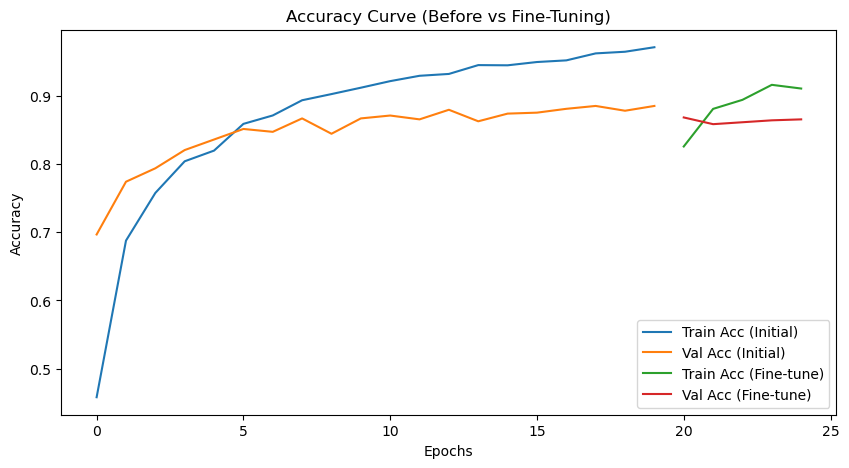

In [14]:
plt.figure(figsize=(10,5))

# Initial training
plt.plot(history.history['accuracy'], label='Train Acc (Initial)')
plt.plot(history.history['val_accuracy'], label='Val Acc (Initial)')

# Fine-tuning (continue curve)
plt.plot(range(len(history.history['accuracy']), 
               len(history.history['accuracy']) + len(history_finetune.history['accuracy'])),
         history_finetune.history['accuracy'], label='Train Acc (Fine-tune)')

plt.plot(range(len(history.history['val_accuracy']), 
               len(history.history['val_accuracy']) + len(history_finetune.history['val_accuracy'])),
         history_finetune.history['val_accuracy'], label='Val Acc (Fine-tune)')

plt.title("Accuracy Curve (Before vs Fine-Tuning)")
plt.xlabel("Epochs")
plt.ylabel("Accuracy")
plt.legend()
plt.show()

**Loss Graph**

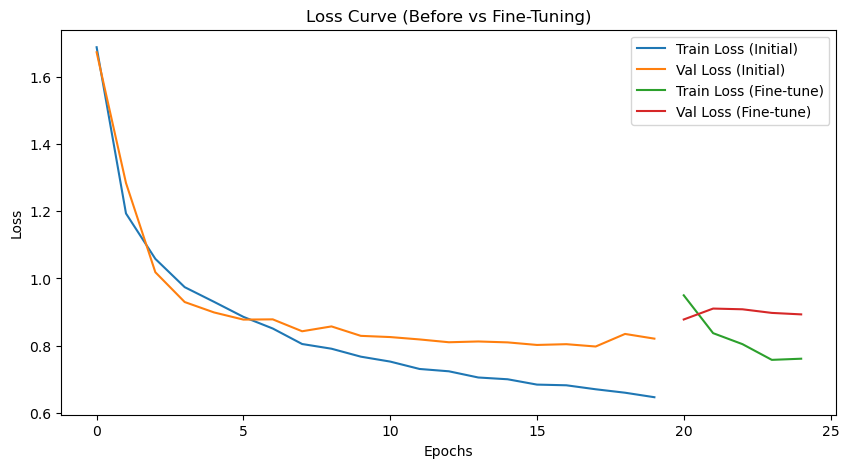

In [15]:
plt.figure(figsize=(10,5))

plt.plot(history.history['loss'], label='Train Loss (Initial)')
plt.plot(history.history['val_loss'], label='Val Loss (Initial)')

plt.plot(range(len(history.history['loss']), 
               len(history.history['loss']) + len(history_finetune.history['loss'])),
         history_finetune.history['loss'], label='Train Loss (Fine-tune)')

plt.plot(range(len(history.history['val_loss']), 
               len(history.history['val_loss']) + len(history_finetune.history['val_loss'])),
         history_finetune.history['val_loss'], label='Val Loss (Fine-tune)')

plt.title("Loss Curve (Before vs Fine-Tuning)")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.legend()
plt.show()

**Evaluation**

In [20]:
model.load_weights("best_model.keras")

test_loss, test_acc, test_precision, test_recall = model.evaluate(test_generator)

print("Test Accuracy:", test_acc)
print("Test Precision:", test_precision)
print("Test Recall:", test_recall)

23/23 ━━━━━━━━━━━━━━━━━━━━ 75s 3s/step - accuracy: 0.8787 - loss: 0.8149 - precision_1: 0.9218 - recall_1: 0.8382
Test Accuracy: 0.8786610960960388
Test Precision: 0.9217791557312012
Test Recall: 0.8382147550582886


**Predictions on Test Set**

23/23 ━━━━━━━━━━━━━━━━━━━━ 89s 4s/step
📊 Classification Report:

                     precision    recall  f1-score   support

          Cardboard       0.81      0.99      0.89        70
      Food Organics       0.93      0.84      0.88        62
              Glass       0.76      0.92      0.83        63
              Metal       0.94      0.86      0.89       119
Miscellaneous Trash       0.83      0.79      0.81        75
              Paper       0.96      0.87      0.91        75
            Plastic       0.93      0.83      0.88       139
      Textile Trash       0.90      0.94      0.92        48
         Vegetation       0.82      0.98      0.90        66

           accuracy                           0.88       717
          macro avg       0.88      0.89      0.88       717
       weighted avg       0.89      0.88      0.88       717



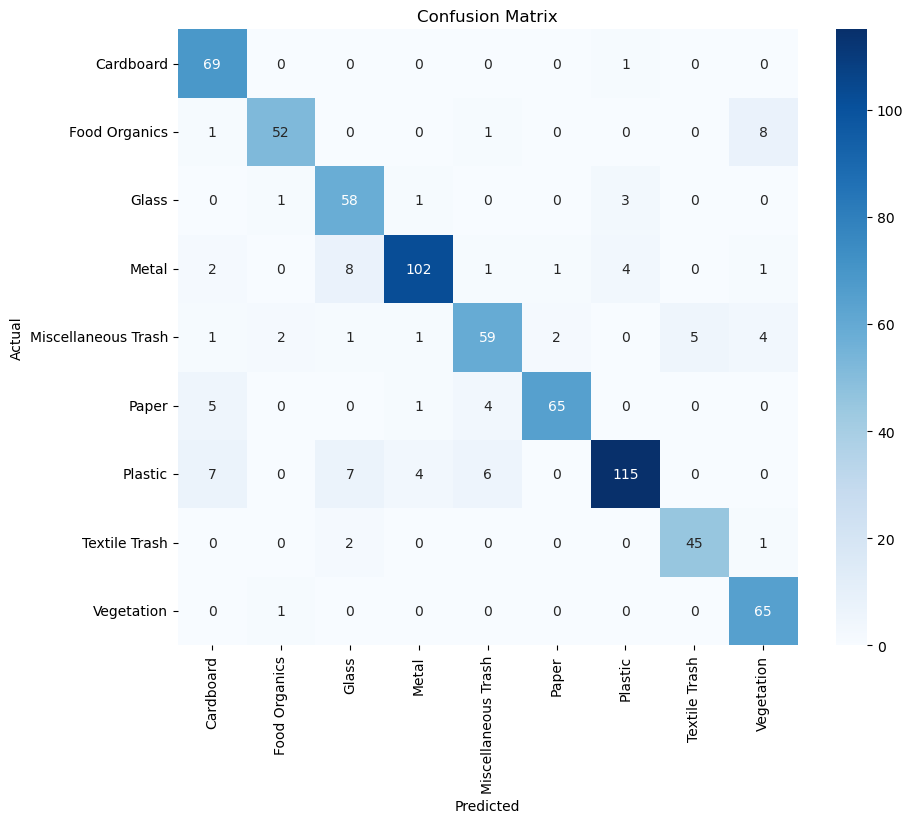

In [21]:
import numpy as np
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns

# Predictions
y_pred_probs = model.predict(test_generator)
y_pred = np.argmax(y_pred_probs, axis=1)

y_true = test_generator.classes
class_labels = list(test_generator.class_indices.keys())

# Report
print("📊 Classification Report:\n")
print(classification_report(y_true, y_pred, target_names=class_labels))

# Confusion Matrix
cm = confusion_matrix(y_true, y_pred)

plt.figure(figsize=(10,8))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=class_labels,
            yticklabels=class_labels)

plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix")
plt.show()

**Show Misclassified Images**

Total Misclassified: 87


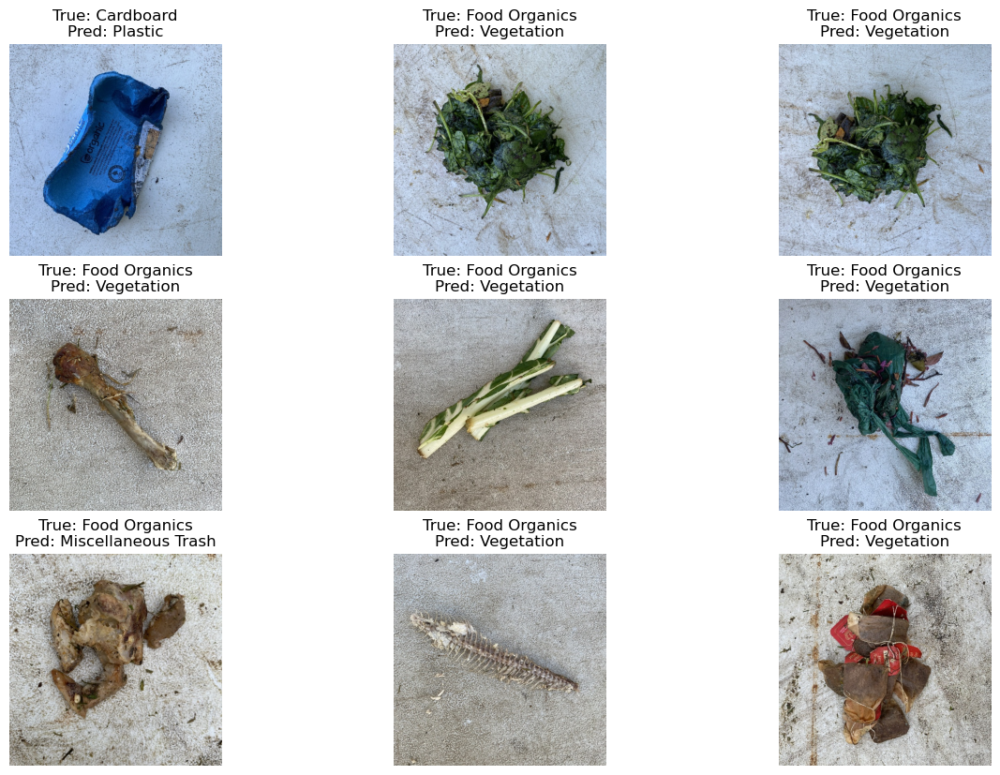

In [22]:
import matplotlib.pyplot as plt
import cv2

file_paths = test_generator.filepaths
misclassified = np.where(y_pred != y_true)[0]

print("Total Misclassified:", len(misclassified))

plt.figure(figsize=(15,10))

for i, idx in enumerate(misclassified[:9]):
    img = cv2.imread(file_paths[idx])
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    true_label = class_labels[y_true[idx]]
    pred_label = class_labels[y_pred[idx]]

    plt.subplot(3,3,i+1)
    plt.imshow(img)
    plt.title(f"True: {true_label}\nPred: {pred_label}")
    plt.axis('off')

plt.show()

**Upload Image & Predict**

In [163]:
from tensorflow.keras.preprocessing import image
import numpy as np
import matplotlib.pyplot as plt

# For file upload
from IPython.display import display
import ipywidgets as widgets

# Create upload button
upload = widgets.FileUpload(accept='image/*', multiple=False)
display(upload)

FileUpload(value=(), accept='image/*', description='Upload')

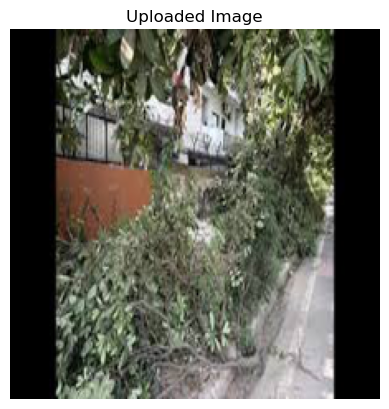

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step
Predicted Class: Vegetation
Confidence: 0.7833812


In [164]:
from tensorflow.keras.applications.efficientnet import preprocess_input
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import io

# Check if file uploaded
if upload.value:
    
    # Handle both tuple and dict cases
    uploaded_file = upload.value[0] if isinstance(upload.value, tuple) else list(upload.value.values())[0]
    
    img_bytes = uploaded_file['content']
    
    # Load image
    img = Image.open(io.BytesIO(img_bytes)).convert('RGB')
    img = img.resize((224, 224))
    
    # Show image
    plt.imshow(img)
    plt.title("Uploaded Image")
    plt.axis('off')
    plt.show()
    
    # Preprocess
    img_array = np.array(img)
    img_array = preprocess_input(img_array)
    img_array = np.expand_dims(img_array, axis=0)
    
    # Predict
    pred = model.predict(img_array)[0]
    
    class_labels = list(train_generator.class_indices.keys())
    pred_class = np.argmax(pred)
    
    print("Predicted Class:", class_labels[pred_class])
    print("Confidence:", np.max(pred))

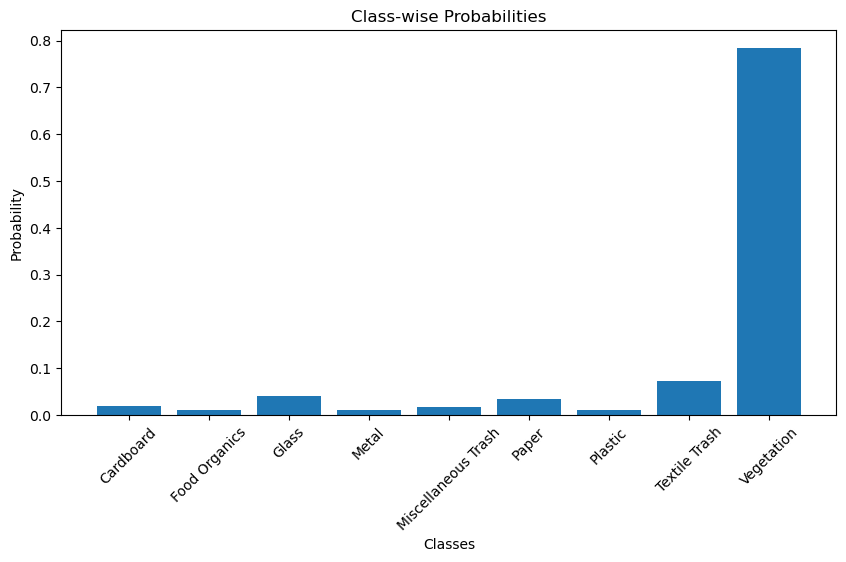

In [165]:
plt.figure(figsize=(10,5))

plt.bar(class_labels, pred)
plt.xticks(rotation=45)

plt.title("Class-wise Probabilities")
plt.xlabel("Classes")
plt.ylabel("Probability")

plt.show()

In [166]:
sorted_idx = np.argsort(pred)[::-1]

print("Top Predictions:\n")

for idx in sorted_idx:
    print(f"{class_labels[idx]}: {pred[idx]:.4f}")

Top Predictions:

Vegetation: 0.7834
Textile Trash: 0.0728
Glass: 0.0398
Paper: 0.0345
Cardboard: 0.0201
Miscellaneous Trash: 0.0173
Plastic: 0.0116
Metal: 0.0107
Food Organics: 0.0098
